#### Set Your Keys

In [5]:
import os
from langchain_community.vectorstores.azuresearch import AzureSearch
from langchain_openai import AzureOpenAIEmbeddings, OpenAIEmbeddings
from langchain_openai import AzureChatOpenAI
from dotenv import load_dotenv
load_dotenv()

azure_endpoint = os.environ["AZURE_ENBOT_ENDPOINT"]
azure_openai_api_key = os.environ["AZURE_ENBOT_API_KEY"]
azure_openai_api_version = os.environ["AZURE_ENBOT_API_VERSION"]
azure_deployment = os.environ["AZURE_ENBOT_EMBEDDINGS_DEPLOYMENT_NAME"]
embeddings = AzureOpenAIEmbeddings(
    azure_deployment=azure_deployment,
    openai_api_version=azure_openai_api_version,
    azure_endpoint=azure_endpoint,
    api_key=azure_openai_api_key,
)

azure_endpoint = os.environ["AZURE_ENBOT_ENDPOINT"]
azure_openai_api_key = os.environ["AZURE_ENBOT_API_KEY"]
azure_openai_api_version = os.environ["AZURE_ENBOT_API_VERSION"]
azure_deployment = os.environ["AZURE_ENBOT_EMBEDDINGS_DEPLOYMENT_NAME"]
llm = AzureChatOpenAI(
    openai_api_key= os.getenv("AZURE_ENBOT_API_KEY"),
    openai_api_version= os.environ["AZURE_ENBOT_API_VERSION"],
    azure_deployment= os.environ["AZURE_ENBOT_LLM_DEPLOYMENT_NAME"],
    azure_endpoint=os.environ["AZURE_ENBOT_ENDPOINT"],
    temperature= 0.6,
    max_tokens = 4096
)
# print(llm.invoke("Hello!").content)
# print(embeddings.embed_query("Hello, world!"))

python-dotenv could not parse statement starting at line 1


##### Load vectorstore

In [6]:
import pickle
import os

def load_all_docstore(filename=r"C:\Codes\01_Personal\00_Multimodels\tutorials\Langchain_pdf_text_and_image\docstore.pkl"):
    if os.path.exists(filename):
        with open(filename, 'rb') as f:
            return pickle.load(f)
    else:
        return {}

# Load variables
variables = load_all_docstore()

# Print only the variable names (keys)
print("Variable names in docstore:", list(variables.keys()))


Variable names in docstore: ['text_docstore', 'image_docstore', 'text_collection', 'image_collection', 'mistral_text_docstore', 'mistral_image_docstore', 'mistral_text_collection', 'mistral_image_collection']


#### Rag for Pdf (Text and Image) Using Langchain and GPT 4o(Run below cell)

In [7]:
import uuid
from langchain.retrievers.multi_vector import MultiVectorRetriever
from langchain.storage import InMemoryStore
from langchain_chroma import Chroma
from langchain_core.documents import Document

# Create separate vector stores for text and images
text_vectorstore = Chroma(collection_name=variables['text_collection'], embedding_function=embeddings, persist_directory=r"C:\Codes\01_Personal\00_Multimodels\tutorials\Langchain_pdf_text_and_image\chroma_text_store")
image_vectorstore = Chroma(collection_name=variables['image_collection'], embedding_function=embeddings, persist_directory=r"C:\Codes\01_Personal\00_Multimodels\tutorials\Langchain_pdf_text_and_image\chroma_image_store")

# Initialize the Document storage layer
text_store = InMemoryStore() 
image_store = InMemoryStore()
id_key = "doc_id"

# Create multi-vector retrievers
text_retriever = MultiVectorRetriever(vectorstore=text_vectorstore, docstore=text_store, id_key=id_key)
image_retriever = MultiVectorRetriever(vectorstore=image_vectorstore, docstore=image_store, id_key=id_key)

text_retriever.docstore.mset(variables['text_docstore'])
image_retriever.docstore.mset(variables['image_docstore'])


python-dotenv could not parse statement starting at line 1
python-dotenv could not parse statement starting at line 1


#### Query the vectorstore and docstore

In [8]:
#### Checking
query = "I want to know the first step of Vendor Invoice with FB60?"
retrieved_text = text_retriever.vectorstore.similarity_search(query, k= 5)
retrieved_image = image_retriever.vectorstore.similarity_search(query, k= 3)
print(len(retrieved_text), len(retrieved_image))
print("Text store count:", text_vectorstore._collection.count())
print("Image store count:", image_vectorstore._collection.count())

5 3
Text store count: 22
Image store count: 9


In [9]:
### Both should be same, both of these hold images.
len(image_retriever.docstore.store),image_vectorstore._collection.count() # holding raw images, and sumaries of raw images

(9, 9)

#### Docstores and vectorstores

In [10]:
def retriever_multi_vector(query):
    retrieved_text = text_retriever.vectorstore.similarity_search(query, k= 10)
    retrieved_image = image_retriever.vectorstore.similarity_search(query, k= 5)
    # print(retrieved_image)
    docs=[]
    for page in retrieved_text:
        docs.append(page.page_content)
    for image_document_id in retrieved_image:
        ## Most imp step: we found top image summaries from vector store know docstore has doc_id which is common in this vector store. So we will get base4 from docstore
        doc = image_retriever.docstore.mget([image_document_id.metadata['doc_id']])
        # Can display images here
        # if doc[0] is not None:
        # plt_img_base64(doc[0])    #### Plot all the retrived images
        docs.extend(doc)
    return docs

# query = "Process Flow Diagram?"
# docs = retriever_multi_vector(query)
# len(docs), docs ## length should be total of parameter k

In [11]:
import re
import base64

# helps in detecting base64 encoded strings
def looks_like_base64(sb):
    """Check if the string looks like base64"""
    return re.match("^[A-Za-z0-9+/]+[=]{0,2}$", sb) is not None

# helps in checking if the base64 encoded image is actually an image
def is_image_data(b64data):
    """
    Check if the base64 data is an image by looking at the start of the data
    """
    image_signatures = {
        b"\xff\xd8\xff": "jpg",
        b"\x89\x50\x4e\x47\x0d\x0a\x1a\x0a": "png",
        b"\x47\x49\x46\x38": "gif",
        b"\x52\x49\x46\x46": "webp",
    }
    try:
        header = base64.b64decode(b64data)[:8]  # Decode and get the first 8 bytes
        for sig, format in image_signatures.items():
            if header.startswith(sig):
                return True
        return False
    except Exception:
        return False

# returns a dictionary separating images and text (with table) elements
def split_image_text_types(docs):
    """
    Split base64-encoded images and texts (with tables).
    """
    b64_images = {}
    texts = []

    image_ind=0
    for doc in docs:
        # Check if the document is of type Document and extract page_content if so
        if isinstance(doc, Document):
            doc = doc.page_content

        # Ensure doc is a string
        if isinstance(doc, bytes):
            doc = doc.decode('utf-8')

        if looks_like_base64(doc) and is_image_data(doc):
            b64_images[image_ind] = doc
            image_ind+=1
        else:
            texts.append(doc)

    return {"images": b64_images, "texts": texts}


#### LLM Pipeline

In [12]:
from operator import itemgetter
from langchain_core.runnables import RunnableLambda, RunnablePassthrough
from langchain_core.messages import HumanMessage
from langchain_core.output_parsers import StrOutputParser

def multimodal_prompt_function(data_dict):
    formatted_texts = "\n".join(data_dict["context"]["texts"])
    messages = []

    if data_dict["context"]["images"]:
        for idx, image_base64 in data_dict["context"]["images"].items():
            image_message = {
                "type": "image_url",
                "image_url": {"url": f"data:image/jpeg;base64,{image_base64}"},
                "metadata": {"index": idx}
            }
            messages.append(image_message)

    text_message = {
        "type": "text",
        "text": (
            f"""You are an AI assistant analyzing a mix of text and image data.
            Your task is to:
            1. Answer the user’s question based on the provided text and images.
            2. Identify which image (if any) is most relevant to the question and return its index.

            User question:
            {data_dict['question']}

            Context documents:
            {formatted_texts}

            List of images and their indices:
            {[(idx, "Image available") for idx in data_dict["context"]["images"].keys()]}

            Expected Output Format (JSON):
            {{
                answer: str = Field(description="Answer to user query.")
                image_index: list[int] = Field(description="index of the most relevant image or -1 if none")
            }}

            Answer:
            """
        ),
    }
    messages.append(text_message)

    return [HumanMessage(content=messages)]

# Create multimodal RAG pipeline
multimodal_rag = (
    {
        "context": itemgetter('context'),
        "question": itemgetter('input'),
    }
    | RunnableLambda(multimodal_prompt_function)
    | llm
    | StrOutputParser()
)

# Retrieve documents and images
retrieve_docs = (
    itemgetter('input')
    | RunnableLambda(retriever_multi_vector)
    | RunnableLambda(split_image_text_types)
)

# Assign context and response
multimodal_rag_w_sources = (
    RunnablePassthrough.assign(context=retrieve_docs)
    .assign(response=multimodal_rag)
)


In [13]:
# ###### Trial Run
import json
def format_response(response):
    result = re.sub(r"json|```", "", response['response'])
    result = json.loads(result)
    print(json.dumps(result, indent=2))
    # print("-"*50)
    if result['image_index']!=-1: # no image is relevant to user query
      for ind, info in enumerate(result['image_index']):
          if info in response['context']['images']:
              result['image_index'][ind] = response['context']['images'][info]
    # print(json.dumps(result, indent=2))
    return result
    result.keys()

# response = multimodal_rag_w_sources.invoke({'input': "Give me profit and Loss statement? "})
# print(response)
# result = format_response(response)

#### Display final ans

In [14]:
from IPython.display import HTML, display, Image, Markdown
from PIL import Image
import base64
from io import BytesIO

def plt_img_base64(img_base64):
    """Display base64 encoded string as an image."""
    try:
        # Decode the base64 string
        img_data = base64.b64decode(img_base64)
        # Create a BytesIO object
        img_buffer = BytesIO(img_data)
        # Open the image using PIL
        img = Image.open(img_buffer)
        display(img)
    except Exception as e:
      pass
        # print(f"Error displaying image: {e}")

def multimodal_rag_qa(query):
    """Retrieve and display the answer along with relevant images."""
    response = multimodal_rag_w_sources.invoke({'input': query})
    print(response)
    result = format_response(response)
    print('==' * 50)
    print(json.dumps(result, indent=2))
    print('==' * 50)
    print('**Answer:**')
    print(result['answer'])

    print('--' * 50)
    if result['image_index']!=-1: # no image is relevant to user query
      for ind in range(len(result['image_index'])):
          plt_img_base64(result['image_index'][ind])
          print()
    print('==' * 50)


{'input': 'What are the Top Clients and Purchases?', 'context': {'images': {0: 'iVBORw0KGgoAAAANSUhEUgAAAeEAAAEgCAIAAAAMnFxIAAAACXBIWXMAAA7EAAAOxAGVKw4bAAEAxUlEQVR4nOy9d5hsVZX3P//8nhElSJIkyTSDjhP0dcZ33plxRl8V1NEXHZULl3gT3EsWkHAT+YIEJQiCJAFBcg5XchIkp6ZzTjfR1VXVFbuqft8+X85inbPP2bVPdbh4L/3U08/p05/ateuEtddea+3v+ave3t6Ojo53on6am5sj98f9fMh/yGvmQ/5D/kN+Mnx7e3tPT89fwUAPDAykUqlMJjM6OrpmzZp33313bGwM26tWrRoZGeE295NZt24d9rvza9euxf5sNovt1atXf8i78Dgjdp7bU8JjO1F/po/Hb+Glz8JjvyOPPcJLHz74PI/J9PGO/cEe4bHHwqO1aeLx+wPCyzExeTJTxWNb8zxTMNN/BWtNqFwu12o1/MZ2qVTCdrFYzOVysh9fAHuwPT4+jm0Xnvu5zf3YU5fH7xDP7WnihWmMx9GYWj7U/zie++PaJ5OUlz4k4rFfeH0MP+Q1X6lUppAn494fzRQKhcj2sd+Rl/35fH5qed2HDYOX4yAMdrrwdLZgnydsNCw6ODnlQOGq0BzjPTDq3I/3SLfwFhc+nU5rXrpi56vVKnn5GjPA05zhOLjwYITHCMfv5cLToZBjEsmzz+uF5zkCn/F+HHlgM8/LOUrE03lx4YUBz/1xPK+Zujz+jORxH4Z4Hn9HHtuh81WXt/c/kseFpPujj6EjL4zw0ocQz3PaGJ/xJgqJeL0dyetzSh4H3J1Hf6rej5xTHDoXHv2EZ93c3PyeH03LjX/jgOLf2MY7YVzwTo4AuHBrnjcHmNsuPG48zaNn2I7k0Y7w2C/tmzxHrTge25G87k+Ilz7wvQ3w/F52XvfHzpv9j+Tx

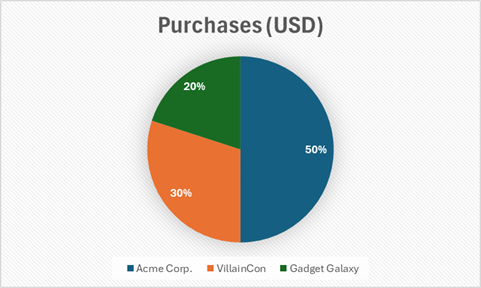

In [15]:
query ="What are the Top Clients and Purchases?"
multimodal_rag_qa(query)

#### Rag for Pdf (Text and Image) Using Langchain and Mistral(run below)

In [17]:
import uuid
from langchain.retrievers.multi_vector import MultiVectorRetriever
from langchain.storage import InMemoryStore
from langchain_chroma import Chroma
from langchain_core.documents import Document

# Create separate vector stores for text and images
text_vectorstore = Chroma(collection_name=variables['mistral_text_collection'], embedding_function=embeddings, persist_directory=r"C:\Codes\01_Personal\00_Multimodels\tutorials\Langchain_pdf_text_and_image\mistral_chroma_text_store")
image_vectorstore = Chroma(collection_name=variables['mistral_image_collection'], embedding_function=embeddings, persist_directory=r"C:\Codes\01_Personal\00_Multimodels\tutorials\Langchain_pdf_text_and_image\mistral_chroma_image_store")

# Initialize the Document storage layer
text_store = InMemoryStore() 
image_store = InMemoryStore()
id_key = "doc_id"

# Create multi-vector retrievers
text_retriever = MultiVectorRetriever(vectorstore=text_vectorstore, docstore=text_store, id_key=id_key)
image_retriever = MultiVectorRetriever(vectorstore=image_vectorstore, docstore=image_store, id_key=id_key)

text_retriever.docstore.mset(variables['mistral_text_docstore'])
image_retriever.docstore.mset(variables['mistral_image_docstore'])


python-dotenv could not parse statement starting at line 1
python-dotenv could not parse statement starting at line 1


{'input': 'What are the Top Clients and Purchases?', 'context': {'images': {0: 'iVBORw0KGgoAAAANSUhEUgAAAeEAAAEgCAIAAAAMnFxIAAAACXBIWXMAAA7EAAAOxAGVKw4bAAEAxUlEQVR4nOy9d5hsVZX3P//8nhElSJIkyTSDjhP0dcZ33plxRl8V1NEXHZULl3gT3EsWkHAT+YIEJQiCJAFBcg5XchIkp6ZzTjfR1VXVFbuqft8+X85inbPP2bVPdbh4L/3U08/p05/ateuEtddea+3v+ave3t6Ojo53on6am5sj98f9fMh/yGvmQ/5D/kN+Mnx7e3tPT89fwUAPDAykUqlMJjM6OrpmzZp33313bGwM26tWrRoZGeE295NZt24d9rvza9euxf5sNovt1atXf8i78Dgjdp7bU8JjO1F/po/Hb+Glz8JjvyOPPcJLHz74PI/J9PGO/cEe4bHHwqO1aeLx+wPCyzExeTJTxWNb8zxTMNN/BWtNqFwu12o1/MZ2qVTCdrFYzOVysh9fAHuwPT4+jm0Xnvu5zf3YU5fH7xDP7WnihWmMx9GYWj7U/zie++PaJ5OUlz4k4rFfeH0MP+Q1X6lUppAn494fzRQKhcj2sd+Rl/35fH5qed2HDYOX4yAMdrrwdLZgnydsNCw6ODnlQOGq0BzjPTDq3I/3SLfwFhc+nU5rXrpi56vVKnn5GjPA05zhOLjwYITHCMfv5cLToZBjEsmzz+uF5zkCn/F+HHlgM8/LOUrE03lx4YUBz/1xPK+Zujz+jORxH4Z4Hn9HHtuh81WXt/c/kseFpPujj6EjL4zw0ocQz3PaGJ/xJgqJeL0dyetzSh4H3J1Hf6rej5xTHDoXHv2EZ93c3PyeH03LjX/jgOLf2MY7YVzwTo4AuHBrnjcHmNsuPG48zaNn2I7k0Y7w2C/tmzxHrTge25G87k+Ilz7wvQ3w/F52XvfHzpv9j+Tx

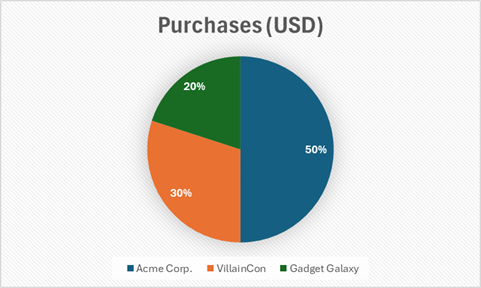

In [18]:
query ="What are the Top Clients and Purchases?"
multimodal_rag_qa(query)